In [1]:
#!usr/bin/env python3
# -*- coding:utf-8 -*-

In [3]:
import numpy as np
import librosa
import librosa.display
import IPython.display
import matplotlib.pyplot as plt
import pandas as pd
%matplotlib inline
# import util

In [41]:
# 波形情報とサンプリングレート(デフォルトでは22500Hz)を取得
mix_path = './src/experiment/ToP!!!!!!!!!!!!!-original.wav'
inst_path = './src/experiment/ToP!!!!!!!!!!!!!-inst.wav'
vocal_path = './src/experiment/ToP!!!!!!!!!!!!!-vocal.wav'

y_mix, sr_mix = librosa.load(mix_path, sr=44100)
y_inst, sr_inst = librosa.load(inst_path, sr=44100)
y_vocal, sr_vocal = librosa.load(vocal_path, sr=44100)

In [42]:
IPython.display.Audio(data=y_mix, rate=sr_mix)

In [43]:
IPython.display.Audio(data=y_inst, rate=sr_inst)

## メル(尺度)周波数
メル尺度(mel scale)は音高の知覚的尺度である．  
メル尺度の差が同じであれば，人間が感じる音高の差が同じになることを意図している．  
人間は可聴域の下限に近い音は高め，上限に近い音は低めに聞こえるらしい．

メル尺度は1000 \[mel\] = 1000 \[Hz\] を基準とし，以下の式で計算される．
$$ m = m_0 \ln{ \left ( \frac{f}{f_0} + 1 \right )} $$
$f_0$は自由パラメータで基準周波数を表し，$m_0$は$1000[mel] = 1000[Hz]$という制約から導かれる式  
$$ m_0 = \frac{1000}{\ln{ \left ( \frac{1000}{f_0} + 1 \right )}} $$
で算出される従属パラメータである．

よく使われる式は
$$ m = 1127.010480 \ln{ \left (\frac{f}{700[Hz]} + 1 \right )} $$

1000\[mel\]から高さが2倍に「感じる」音が2000\[mel\]，半分に感じる音が500\[mel\]であり，周波数領域でのオクターブ(:周波数が二倍)とは異なるので注意が必要．

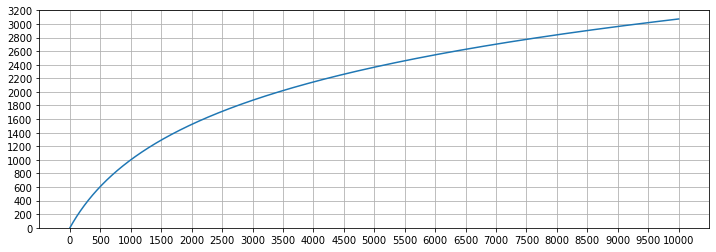

In [20]:
# メル周波数の図示
x = np.linspace(0, 10000, 10000)
m = 1127 * (np.log(x / 700 + 1))

plt.figure(facecolor='w', figsize=(12, 4))
plt.plot(x, m)
plt.xticks(np.arange(0, 10000 + 1, 500))
plt.yticks(np.arange(0, 3200 + 1, 200))
plt.ylim(0, 3200)
plt.grid(True)
plt.show()

## (参考)ケプストラム
ケプストラム(cepstrum)とは，信号のフーリエ変換の対数に位相アンラッピングを施したものをフーリエ変換したものである．**スペクトルのスペクトル**とも呼ばれる．

ケプストラムを用いるとスペクトルの細かな変動(スペクトル微細構造)となだらかな変動(スペクトル包絡)を分離できる．**スペクトル包絡**は**人間の声道の特性を表している**ため，音声認識や音声合成では重要な情報である．

In [45]:
# メルスケールのパワー(音圧)スペクトログラムを作成
S_mix = librosa.feature.melspectrogram(y_mix, sr=sr_mix, n_mels=128)
S_inst = librosa.feature.melspectrogram(y_inst, sr=sr_inst, n_mels=128)
S_vocal = librosa.feature.melspectrogram(y_vocal, sr=sr_vocal, n_mels=128)

# 旧librosa.core.logamplitude
# ログスケール(dB:デシベル)に変換，ピーク音圧を参照する
log_S_mix = librosa.power_to_db(S_mix, ref=np.max)
log_S_inst = librosa.power_to_db(S_inst, ref=np.max)
log_S_vocal = librosa.power_to_db(S_vocal, ref=np.max)

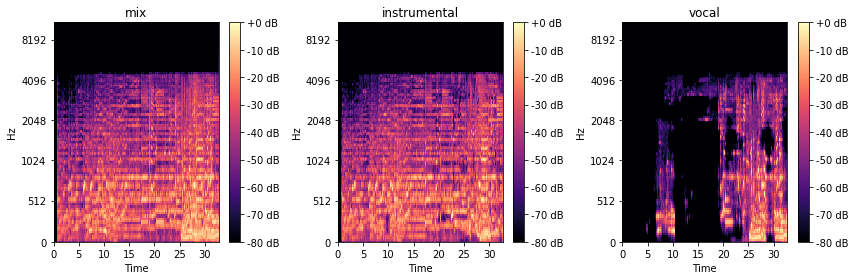

In [55]:
# スペクトログラムの描画
plt.figure(facecolor='w', figsize=(12, 4))
plt.subplot(131)
librosa.display.specshow(log_S_mix, sr=sr_mix, x_axis='time', y_axis='mel')
plt.title('mix')
plt.colorbar(format='%+02.0f dB')

plt.subplot(132)
librosa.display.specshow(log_S_inst, sr=sr_inst, x_axis='time', y_axis='mel')
plt.title('instrumental')
plt.colorbar(format='%+02.0f dB')

plt.subplot(133)
librosa.display.specshow(log_S_vocal, sr=sr_vocal, x_axis='time', y_axis='mel')
plt.title('vocal')
plt.colorbar(format='%+02.0f dB')

plt.tight_layout()
plt.show()

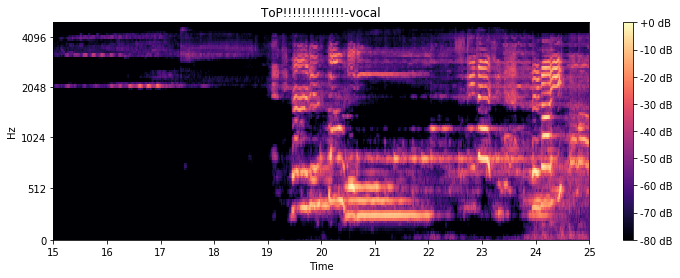

In [57]:
# vocalのみ詳しく見る
plt.figure(facecolor='w', figsize=(12, 4))
librosa.display.specshow(log_S_vocal, sr=sr_vocal, x_axis='time', y_axis='mel')
plt.title('ToP!!!!!!!!!!!!!-vocal')
plt.xlim(15, 25)
plt.ylim(0, 5000)
plt.colorbar(format='%+02.0f dB')
plt.show()

In [44]:
IPython.display.Audio(data=y_vocal, rate=sr_vocal)